Copyright 2015-2025 Universidad Complutense de Madrid (UCM)

This file contains code adapted from Numina https://github.com/guaix-ucm/numina.

It was developed by N. Cardiel for students of the Astrophysics Master (UCM).

This is an adapted version for lectures at ULS (Chile).

* License:
SPDX-License-Identifier: GPL-3.0+

* Modified by:
C. Cabello (UCM; Spain), 
L. Costantin (CAB; Spain)

## Wavelength calibration -  grism G100

We will use an arc image `fzt_cal_*.fits` to calibrate the scientific images of our star. Ideally, we will use the arc which is closest in time to the spectrum of our target object.

### Imports

In [1]:
'''
:Settings:
conda activate uls_2025

:History:
23 Mar 25:  version 1.0
'''

import glob
import numpy as np
import teareduce as tea
import astropy.units as u
import matplotlib.pyplot as plt

from pathlib import Path
from astropy.io import fits
from ccdproc import ImageFileCollection

tea.avoid_astropy_warnings(True)

__version__ = "1.0"
__author__  = "Cristina Cabello (UCM, Spain) and Luca Costantin (CAB, Spain)"


### Read files

In [2]:
galaxy_ID        = 'ngc2366'
specphot_star_ID = 'HR3454'

## MODIFY THE FOLLOWING

abs_path = f'/home/diegosuzaku/NGC2366Workshop'

dir_calibration = Path(f'{abs_path}/calibration/spectroscopy')


### List and select arc and target images

We can have mulitple arc images and we want to select the appropriate one.

In [3]:
list_arc     = []
list_science = []

input_files = sorted(glob.glob(f'{dir_calibration}/fzt_*.fits'))

for file in input_files:

    with fits.open(file) as hdu:
        k_imagetyp = hdu[0].header['IMAGETYP']

    if (k_imagetyp == 'arc'):

        list_arc.append(file)

    if (k_imagetyp == 'science'):

        list_science.append(file)

print(f'Arc:      {len(list_arc)} files.')
print(f'Science:  {len(list_science)} files.')


Arc:      3 files.
Science:  4 files.


In [4]:
selected_keywords = ['NAXIS1', 'NAXIS2', 'OBJECT' ,'IMAGETYP', 'EXPTIME' , 
                     'INSFLID', 'DATE-OBS', 'FILTER']

ifc_arc = ImageFileCollection(location=f'{dir_calibration}',
                              filenames=list_arc,
                              keywords=selected_keywords)

summary_arc = tea.ifc_statsummary(ifc_arc, dir_calibration)
summary_arc.show_in_notebook()


  0%|          | 0/3 [00:00<?, ?it/s]

/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/traitlets/__init__.py:28: DeprecationWarning: 
            Sentinel is not a public part of the traitlets API.
            It was published by mistake, and may be removed in the future.
            
  warn(
/opt/lsst/software/stack/conda/envs/lsst-scipipe-10.0.0/lib/python3.12/site-packages/traittypes/traittypes.py:188: DeprecationWarning: metadata {'dtype': None} was set from the constructor. With traitlets 4.1, metadata should be set using the .tag() method, e.g., Int().tag(key1='value1', key2='value2')
  super(DataFrame, self).__init__(


DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

**Type here the filename of the arc image you want to use**

In [5]:
## MODIFY THE FOLLOWING

input_filename = 'fzt_cali_0035.fits'
data = fits.getdata(dir_calibration / input_filename)

naxis2, naxis1 = data.shape

print(f'Reading file: {input_filename}')
print(f'NAXIS1: {naxis1}')
print(f'NAXIS2: {naxis2}')

Reading file: fzt_cali_0035.fits
NAXIS1: 2039
NAXIS2: 1191


We can graphically see that the image shows a significant distortion C.

Text(0, 0.5, 'Y axis (px) --> spatial direction')

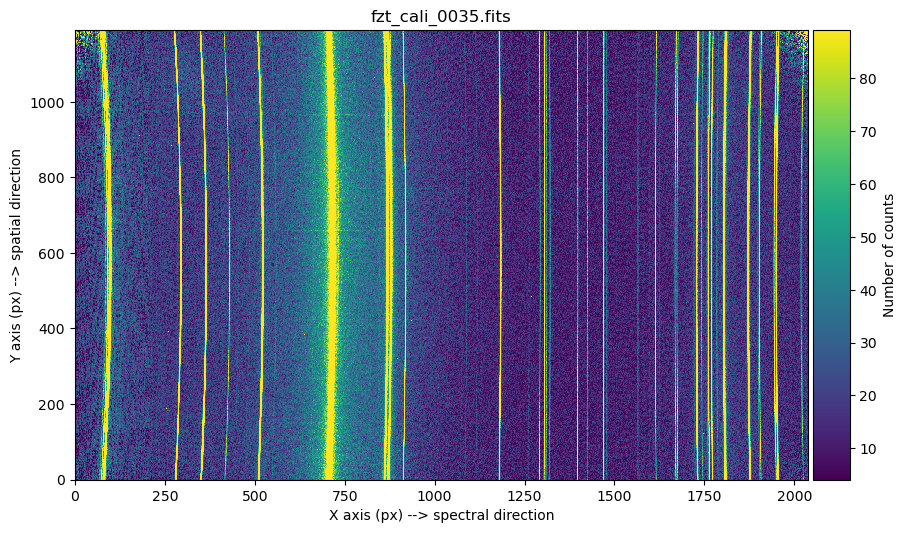

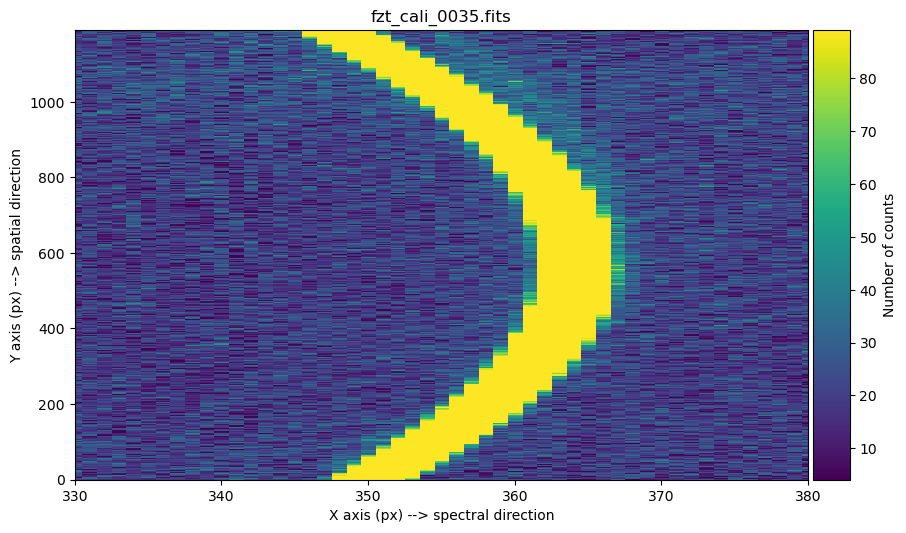

In [6]:
vmin, vmax = np.percentile(data, [5, 95])
fig, ax = plt.subplots(figsize=(10, 10 * naxis2 / naxis1))
tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax, title=input_filename, aspect='auto')
ax.set_xlabel('X axis (px) --> spectral direction')
ax.set_ylabel('Y axis (px) --> spatial direction')

fig, ax = plt.subplots(figsize=(10, 10 * naxis2 / naxis1))
tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax, title=input_filename, aspect='auto')
ax.set_xlim([330, 380])
ax.set_xlabel('X axis (px) --> spectral direction')
ax.set_ylabel('Y axis (px) --> spatial direction')

### Detect peaks in 1D central spectrum

We start the wavelength calibration by detecting the main peaks in the 1D spectrum of the arc. We use an average (median) spectrum calculated on an interval centered on the spatial direction

In [7]:
wavecalib = tea.TeaWaveCalibration()
# print(tea.TeaWaveCalibration.__doc__)

ns_range = tea.SliceRegion1D(np.s_[625:675], mode='fits')

Searching for peaks. 

By trial and error we found `sigma_smooth=1` and `delta_flux=10` are good enough for finding the peaks. 

--> Saving PDF file: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/plot_fzt_cali_0035_xpeaks.pdf


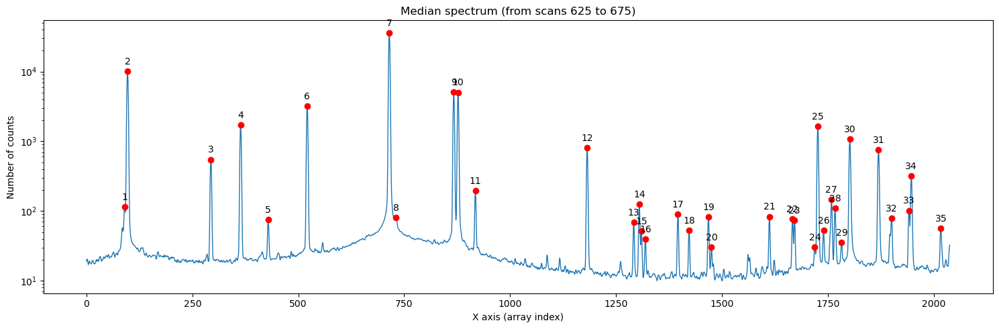

In [21]:
(xpeaks_reference_initial, 
 ixpeaks_reference, 
 spectrum_reference) = wavecalib.compute_xpeaks_reference(data=data,
                                                          sigma_smooth=0.9,
                                                          delta_flux=10,
                                                          ns_range=ns_range,
                                                          plot_spectrum=True,
                                                          pdf_output=dir_calibration / f'plot_{Path(input_filename).stem}_xpeaks.pdf')


We can save an image of the spectrum in a PDF file using the `pdf_output` parameter (there is no need to re-specify the `sigma_smooth` and `delta_flux` parameters. The `wavecalib` object stores the last used values).

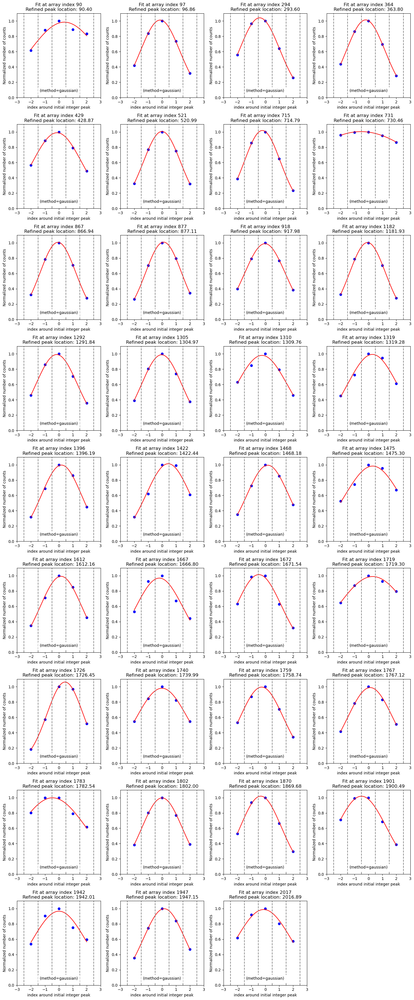

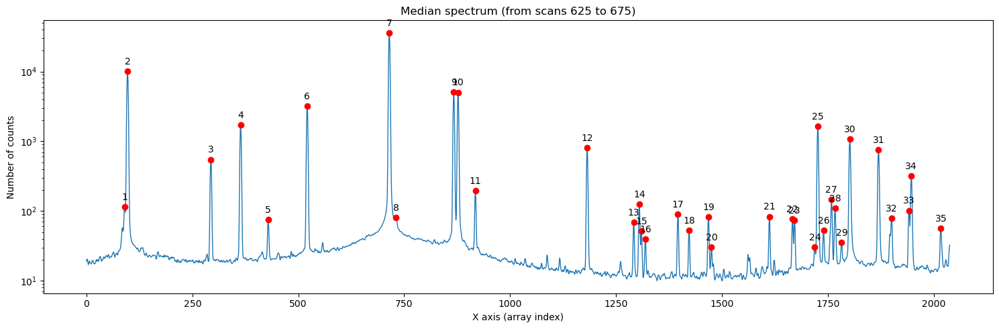

In [18]:
(xpeaks_reference_initial, 
 ixpeaks_reference, 
 spectrum_reference) = wavecalib.compute_xpeaks_reference(data=data,
                                                          ns_range=ns_range,
                                                          plot_spectrum=True,
                                                          plot_peaks=True)

We show the peaks found (with their order number) to then determine which lines have known wavelengths. 

See [CAFOS Comparison Lines for Spectroscopy](http://w3.caha.es/CAHA/Instruments/CAFOS/comp.html).

In [19]:
for i, item in enumerate(xpeaks_reference_initial):
    print(f'line #{i+1:2d}: {item:7.2f}')

line # 1:   90.40 pix
line # 2:   96.86 pix
line # 3:  293.60 pix
line # 4:  363.80 pix
line # 5:  428.87 pix
line # 6:  520.99 pix
line # 7:  714.79 pix
line # 8:  730.46 pix
line # 9:  866.94 pix
line #10:  877.11 pix
line #11:  917.98 pix
line #12: 1181.93 pix
line #13: 1291.84 pix
line #14: 1304.97 pix
line #15: 1309.76 pix
line #16: 1319.28 pix
line #17: 1396.19 pix
line #18: 1422.44 pix
line #19: 1468.18 pix
line #20: 1475.30 pix
line #21: 1612.16 pix
line #22: 1666.80 pix
line #23: 1671.54 pix
line #24: 1719.30 pix
line #25: 1726.45 pix
line #26: 1739.99 pix
line #27: 1758.74 pix
line #28: 1767.12 pix
line #29: 1782.54 pix
line #30: 1802.00 pix
line #31: 1869.68 pix
line #32: 1900.49 pix
line #33: 1942.01 pix
line #34: 1947.15 pix
line #35: 2016.89 pix


We select the peaks that correspond to lines with good signal (using the numbering of the previous lines).

**Modify the following cells**

--> Saving PDF file: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/plot_fzt_cali_0035_identified_lines.pdf


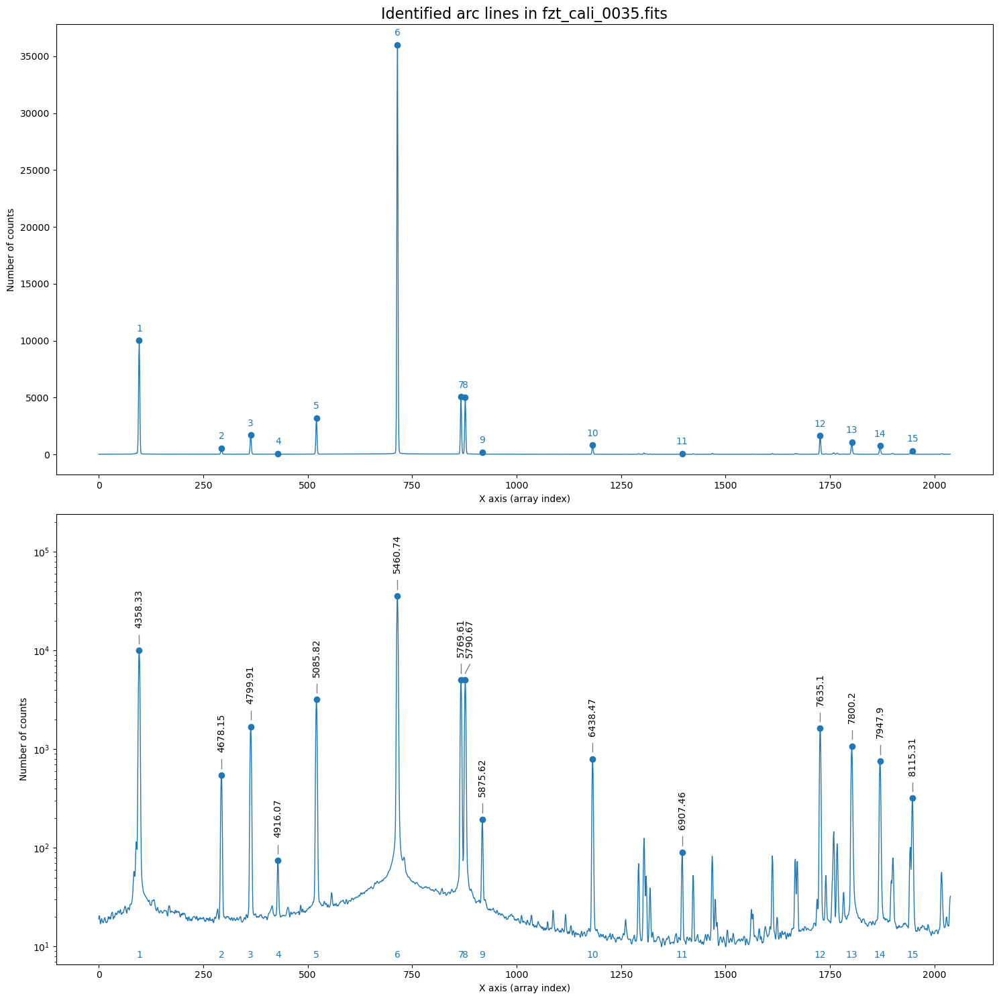

In [36]:
## MODIFY THE FOLLOWING

good_peaks = [2,3,4,5, 6,7,9,10,11, 12, 17, 25, 30, 31, 34]

wavelengths_reference=np.array([4358.33, 4678.15, 4799.91, 4916.07, 5085.82, 5460.74, 5769.61, 5790.67, 5875.62, 6438.47, 6907.46, 7635.1, 7800.2, 7947.9, 8115.31]) * u.Angstrom

xpeaks_reference = [xpeaks_reference_initial[i-1].value for i in good_peaks] * u.pixel

wavecalib.define_peak_wavelengths(xpeaks=xpeaks_reference,
                                  wavelengths=wavelengths_reference)

filename_plot = Path(dir_calibration / f'plot_{Path(input_filename).stem}_identified_lines.pdf')

wavecalib.overplot_identified_lines(xpeaks=xpeaks_reference,
                                    spectrum=spectrum_reference,
                                    title=f'Identified arc lines in {input_filename}',
                                    pdf_output=filename_plot)

### Polynomial solution for wavelength calibration

We calculate the wavelength calibration polynomial (by trial and error we determine `degree_wavecalib=?`).

>>> CRPIX1.............: 1.0 pix
>>> CRVAL1 linear scale: 4213.634988389254 Angstrom
>>> CDELT1 linear scale: 2.0098481940014823 Angstrom / pix
>>> CRMAX1 linear scale: 8309.705607764276 Angstrom

>>> Fitted coefficients pixel(wavelength):
 [-1.53874095e+04  1.14406034e+01 -3.79830299e-03  7.17996542e-07
 -7.76944450e-11  4.52799199e-15 -1.10253348e-19]
>>> Residual std.........................: 0.05004127664028732 pix

>>> Fitted coefficients wavelength(pixel):
 [ 4.21218454e+03  1.44997964e+00  4.67832838e-04 -6.27404454e-08
 -2.71750919e-11  6.15744816e-15 -2.70550939e-19]
>>> Residual std.........................: 0.10057536948101004 Angstrom


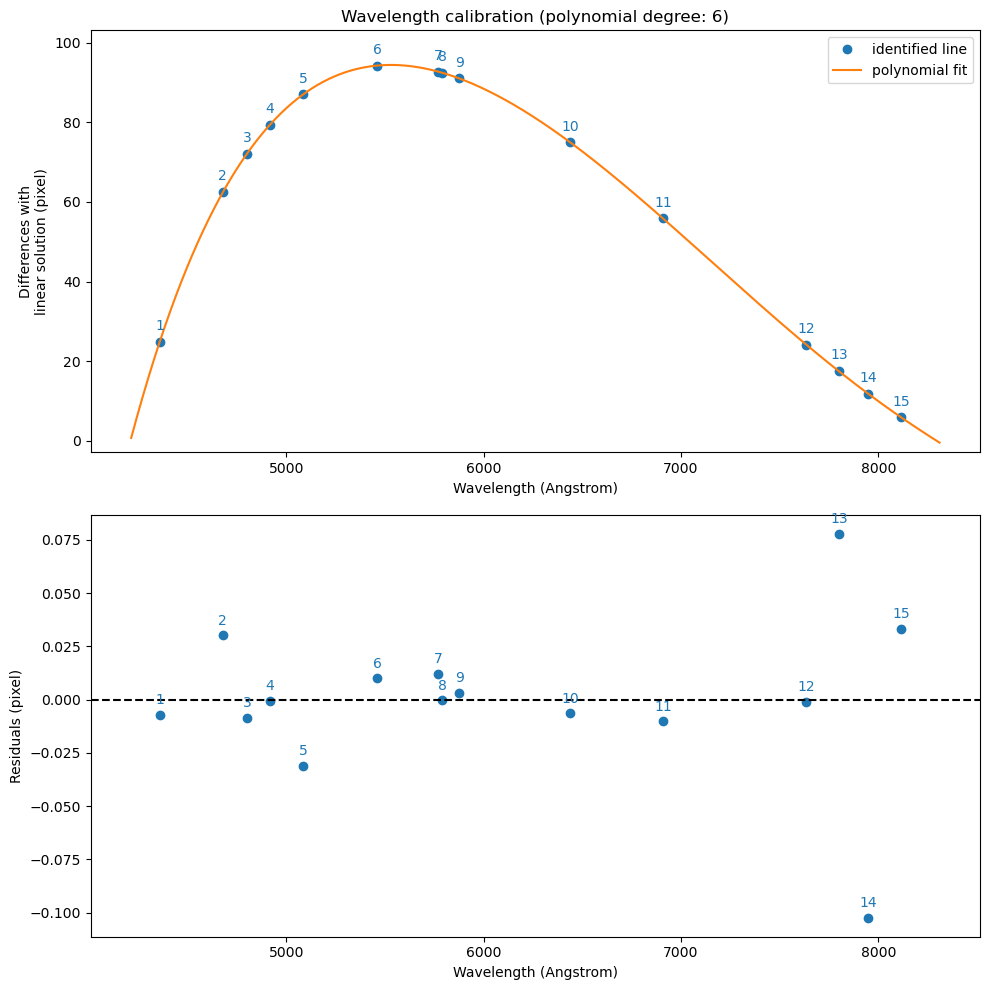

In [44]:
(poly_fits_wav, 
 residual_std_wav, 
 poly_fits_pix, 
 residual_std_pix, 
 crval1_linear, 
 cdelt1_linear, 
 crmax1_linear) = wavecalib.fit_xpeaks_wavelengths(xpeaks=xpeaks_reference,
                                                   degree_wavecalib=6,
                                                   debug=True,
                                                   plots=True)

We can calculate the wavelengths predicted by the polynomial calculated at any position of the `xpeaks_reference + 1` positions (note that we add 1 because the fitted polynomials use the position of the lines following the FITS convention, while `xpeaks_reference` are the positions in the numpy array).

In [45]:
poly_fits_wav(xpeaks_reference.value + 1)

array([4358.50097886, 4678.15095357, 4799.90142711, 4916.11749412,
       5085.82644166, 5460.73680227, 5769.57373966, 5790.60904792,
       5875.57418239, 6438.5137837 , 6907.44081551, 7635.1157684 ,
       7800.44334848, 7947.73219925, 8115.1983887 ])

The numbers above should be compared with:

In [46]:
wavecalib.peak_wavelengths

<Quantity [4358.33, 4678.15, 4799.91, 4916.07, 5085.82, 5460.74, 5769.61,
           5790.67, 5875.62, 6438.47, 6907.46, 7635.1 , 7800.2 , 7947.9 ,
           8115.31] Angstrom>

We can also predict the wavelengths of all peaks found at the beginning (including those lines whose wavelengths we have not assigned).

In [47]:
poly_fits_wav(xpeaks_reference_initial.value + 1)

array([4348.56648592, 4358.50097886, 4678.15095357, 4799.90142711,
       4916.11749412, 5085.82644166, 5460.73680227, 5492.00953158,
       5769.57373966, 5790.60904792, 5875.57418239, 6438.5137837 ,
       6678.21577077, 6706.97294119, 6717.48943327, 6738.36610075,
       6907.44081551, 6965.27986392, 7066.12852619, 7081.83396018,
       7383.75005352, 7504.09060084, 7514.49974942, 7619.44155222,
       7635.1157684 , 7664.81466866, 7705.88707138, 7724.22717074,
       7757.95308181, 7800.44334848, 7947.73219925, 8014.50561363,
       8104.12370281, 8115.1983887 , 8264.69651676])

### Search for peaks in the full 2D image

We look for the peaks of the lines starting at a central position in the spatial direction, which is where we have calculated the average spectrum that has allowed us to calculate `xpeaks_reference`, and move downwards (`direction='down'`).

Finding peaks:   0%|          | 0/650 [00:00<?, ?it/s]

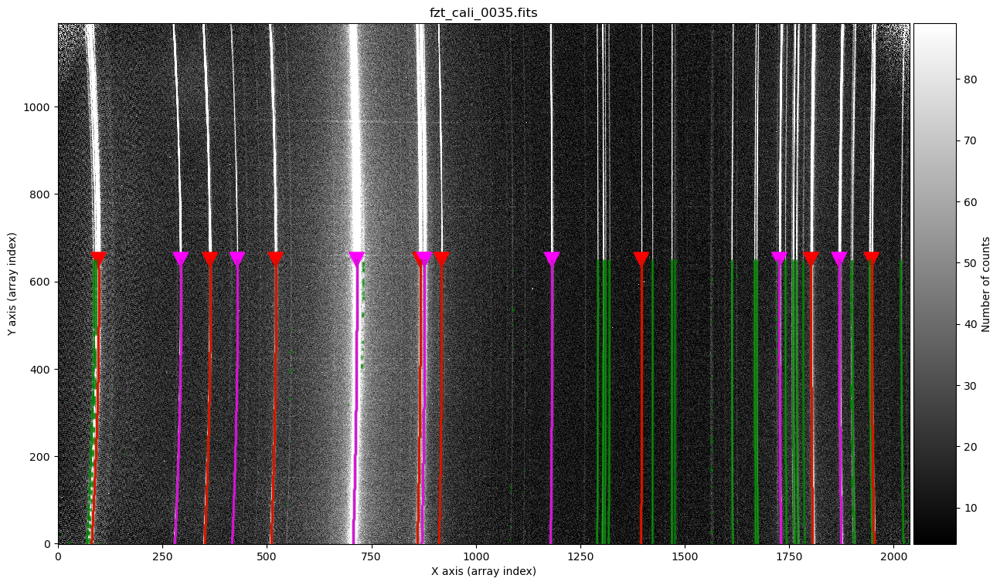

In [48]:
wavecalib.compute_xpeaks_image(data=data, 
                               xpeaks_reference=xpeaks_reference,
                               ns_range=tea.SliceRegion1D(np.s_[1:650], 
                                                          mode='fits'),
                               direction='down',
                               plots=True,
                               title=input_filename,
                               disable_tqdm=False)

We finish the peak search by moving now from the center to the top of the image (`direction='up'`, which is the default value, although we include it for clarity).

Finding peaks:   0%|          | 0/542 [00:00<?, ?it/s]

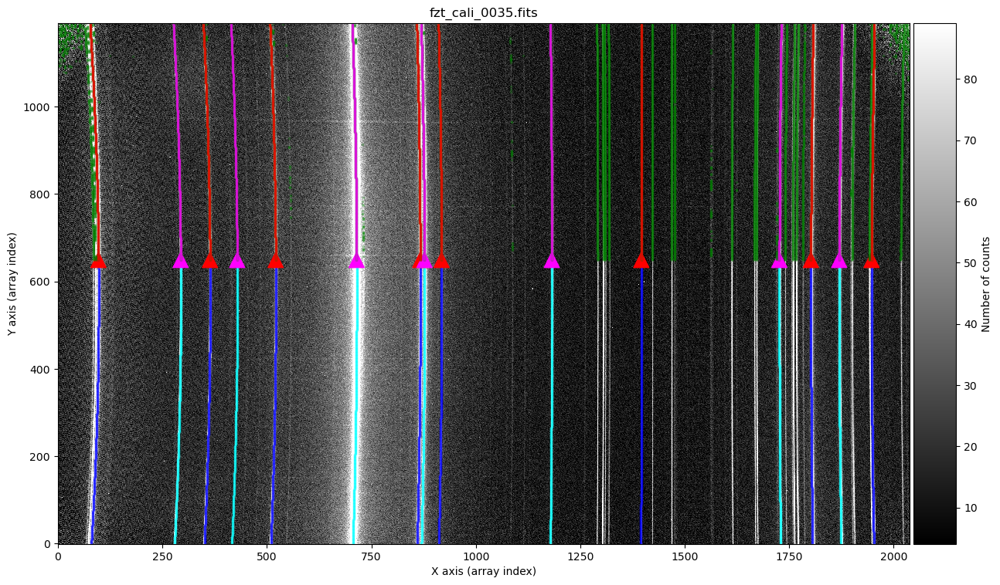

In [49]:
wavecalib.compute_xpeaks_image(data=data, 
                               xpeaks_reference=xpeaks_reference,
                               ns_range=tea.SliceRegion1D(np.s_[650:naxis2], 
                                                          mode='fits'),
                               direction='up',
                               plots=True,
                               title=input_filename,
                               disable_tqdm=False)

### Fitting the C-distortion

We adjust the C-distortion (by trial and error we determine `degree_cdistortion=5`).

Fitting C distortion:   0%|          | 0/15 [00:00<?, ?it/s]

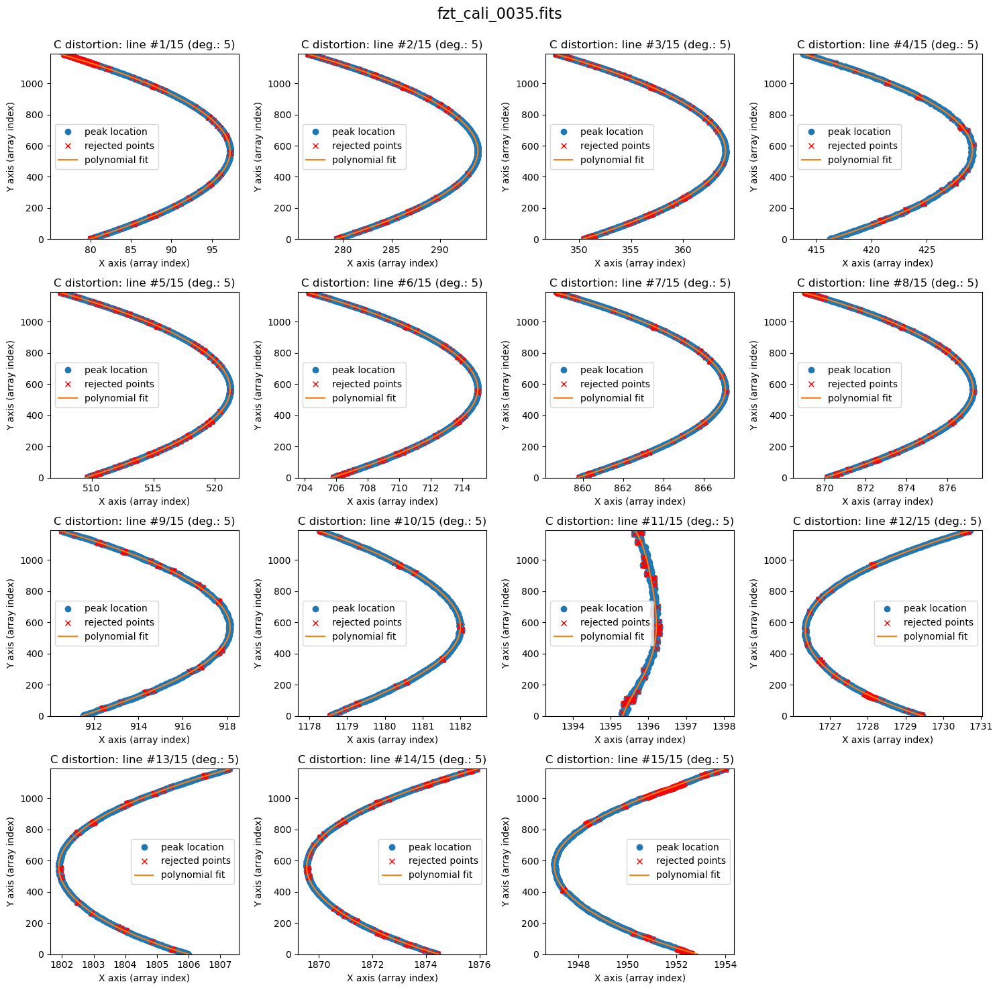

In [50]:
wavecalib.fit_cdistortion(degree_cdistortion=5, 
                          plots=True,
                          title=input_filename,
                          disable_tqdm=False)

We draw the adjustments on the image itself

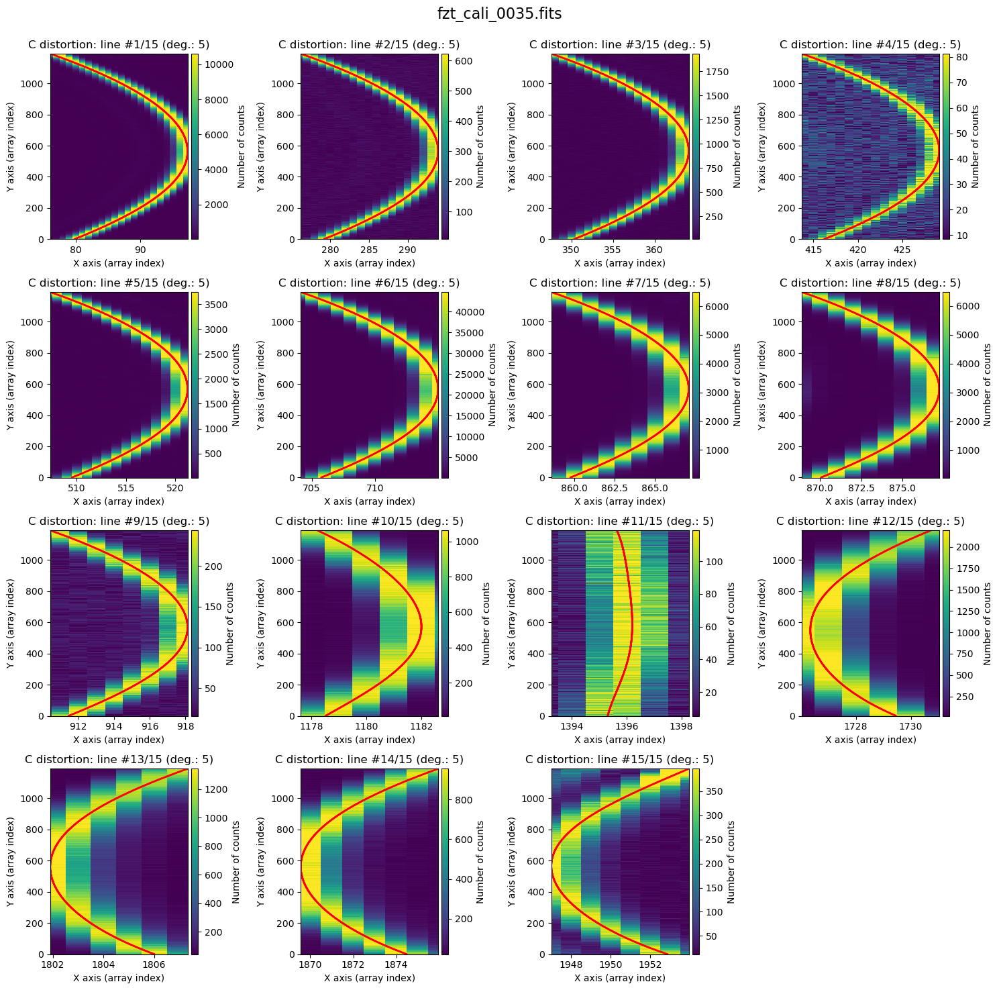

In [51]:
wavecalib.plot_cdistortion(data, title=input_filename)

## Derive the 2D wavelength calibration

We calculate the final calibration and save it in a FITS file (with the name of the initial image, adding the prefix `wavecal_`).

Computing wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]

>>> minimum CRVAL1 linear: 4213.051948228273 Angstrom
>>> maximum CRMAX1 linear: 8309.996925924657 Angstrom
>>> mean CDELT1..........: 2.010277221637087 Angstrom
--> Saving result in FITS file: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/wavecal_fzt_cali_0035.fits


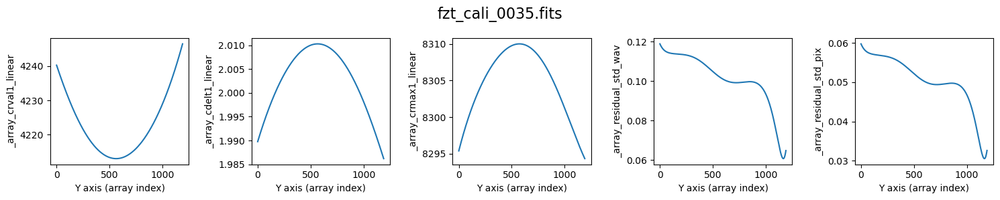

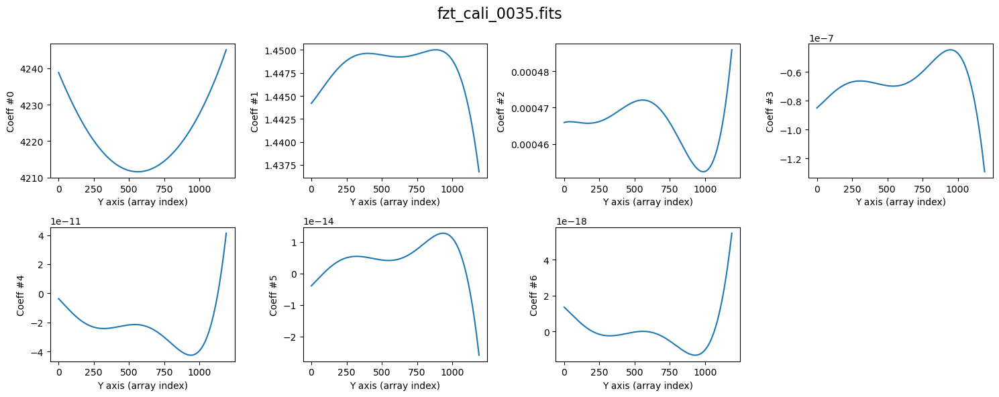

In [52]:
# define additional information for the image header
history_list = ['Wavelength calibration',
                f'Input file: {input_filename}']

# name of the auxiliary FITS file
wavecal_filename = f'wavecal_{input_filename}'

# compute wavelength calibration and save result in auxiliary FITS file
wavecalib.fit_wavelengths(output_filename=dir_calibration / wavecal_filename,
                          history_list=history_list,
                          plots=True,
                          title=input_filename,
                          disable_tqdm=False)

### Applying the 2D wavelength calibration

#### data array

We are going to apply the calculated calibration on the data array corresponding to the arc image itself. The values shown above for `CRVAL1 linear` and `mean CDELT1` allow us to choose appropriate values of `CRVAL1` and `CDELT1` for the calibrated image.

In [53]:
## MODIFY THE FOLLOWING

crval1 = 4213.051948228273 * u.Angstrom
cdelt1 = 2.010277221637087 * u.Angstrom / u.pixel

In [54]:
data_wavecalib = wavecalib.apply(data=data, 
                                 crval1=crval1,
                                 cdelt1=cdelt1, 
                                 disable_tqdm=False)

>>> Using CDELT1: 1 pix
>>> Using CRVAL1: 4213.051948228273 Angstrom
>>> Using CDELT1: 2.010277221637087 Angstrom / pix


Applying wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]

We show graphically the lines before/after the calibration. Since the C-distortion is important, we make the window a little wider in the spectral direction to cover more pixels (`semi_window=25`).

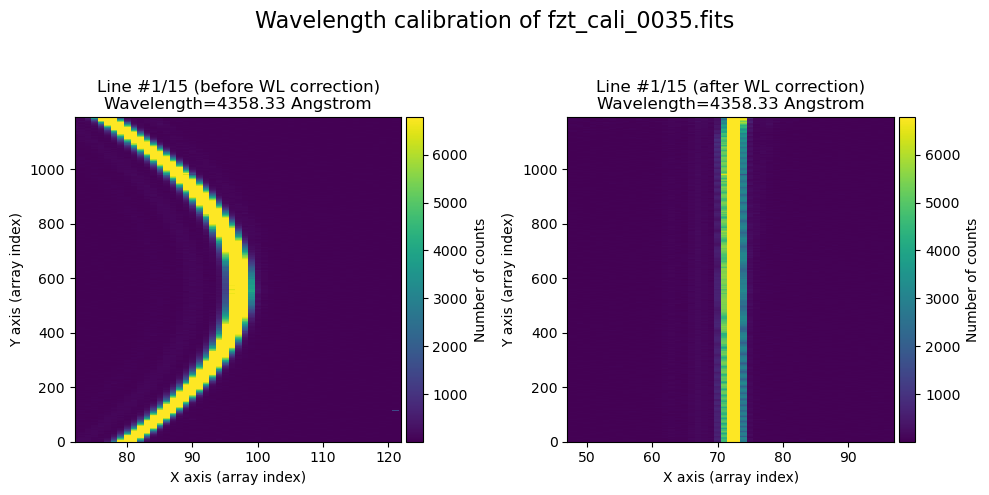

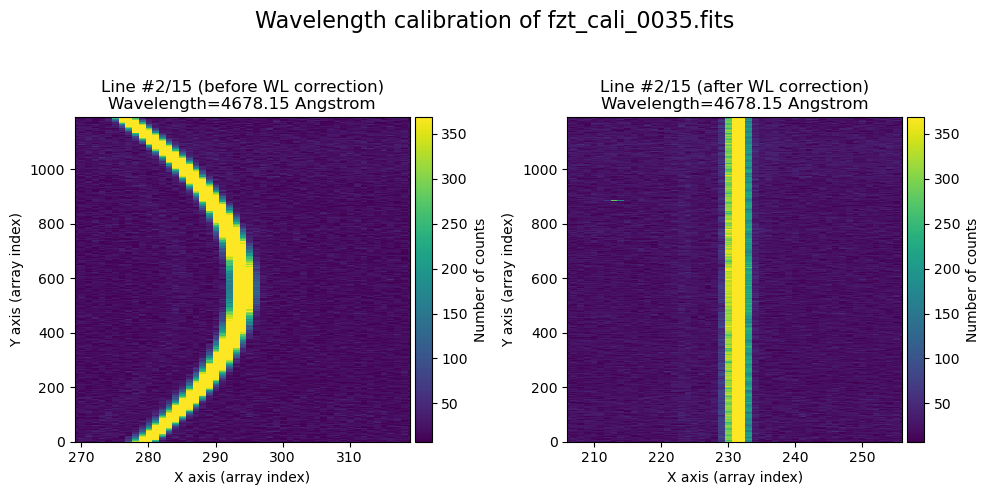

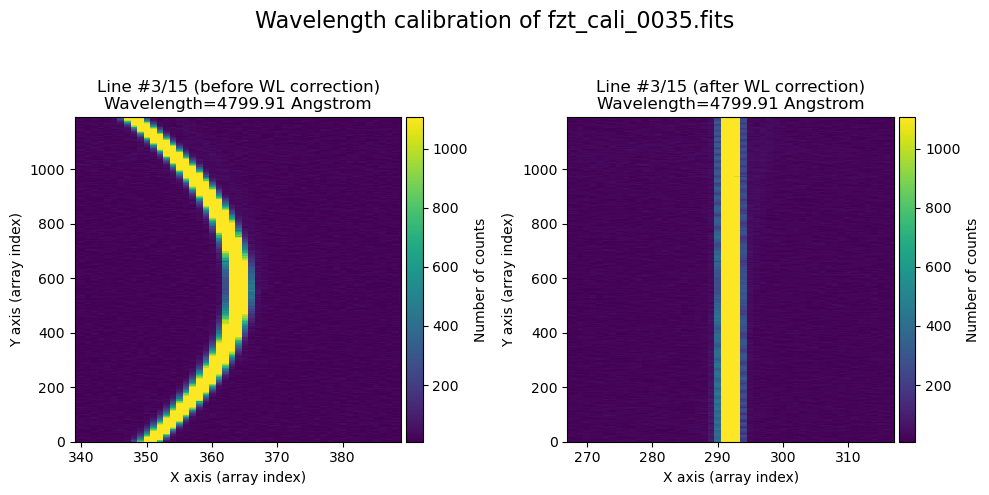

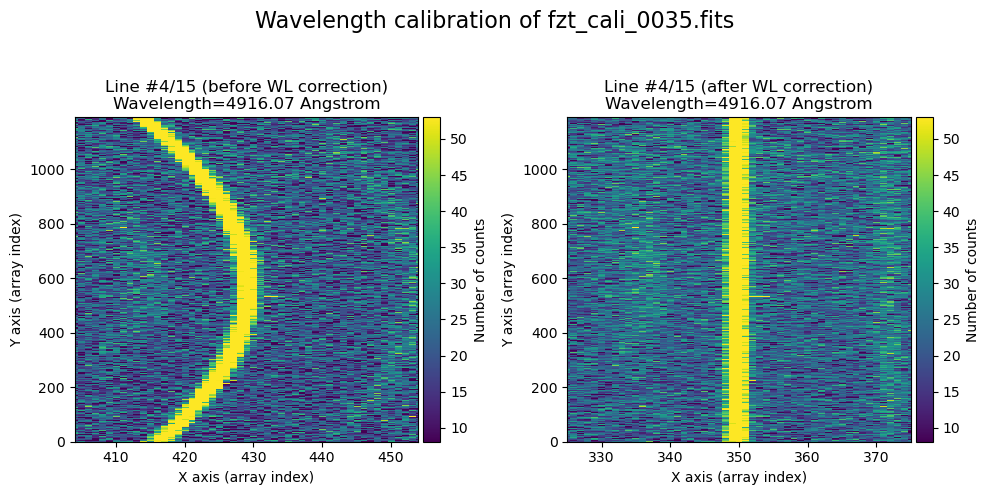

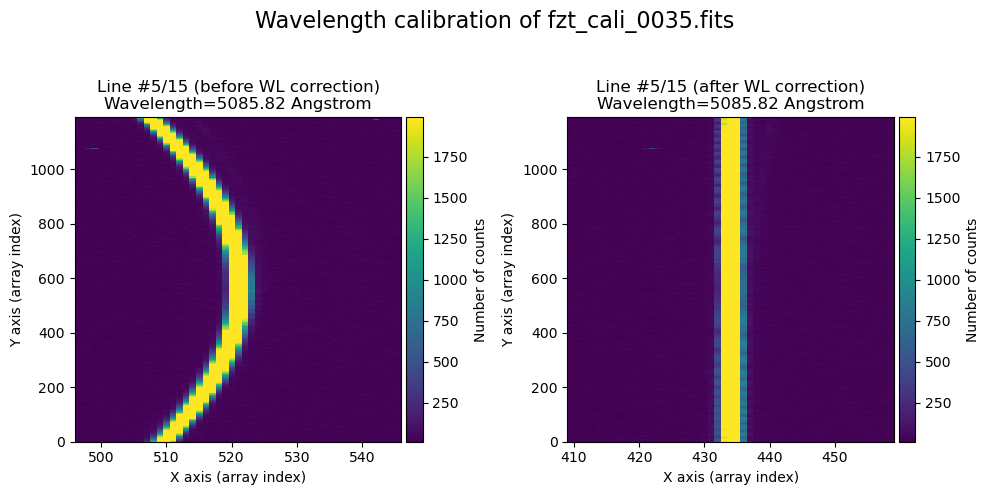

...

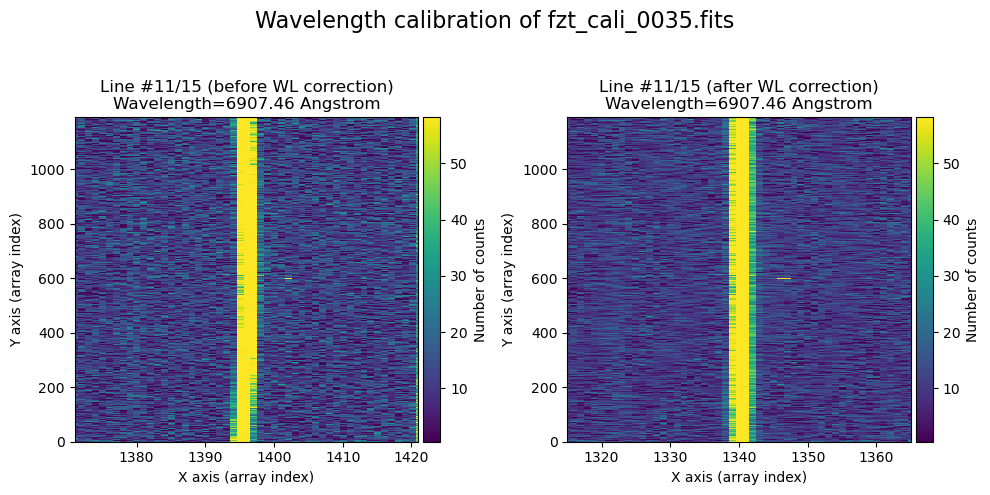

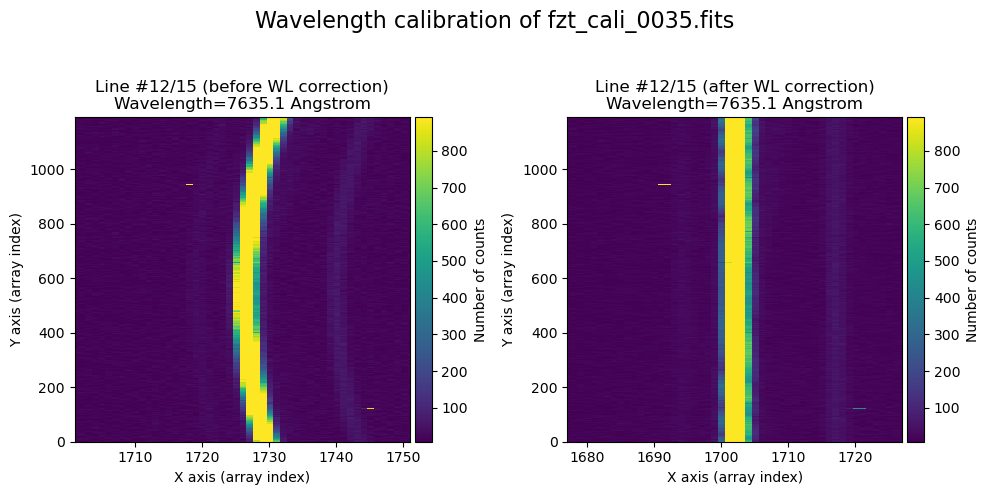

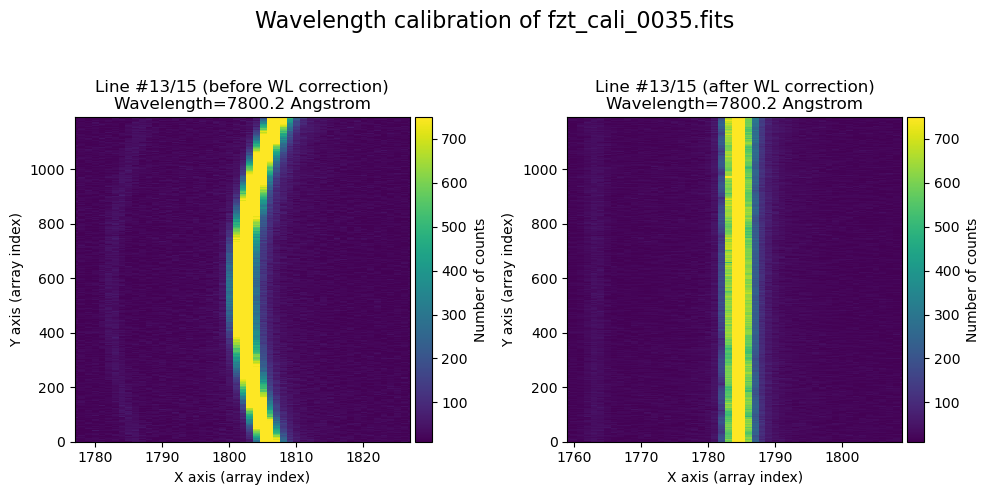

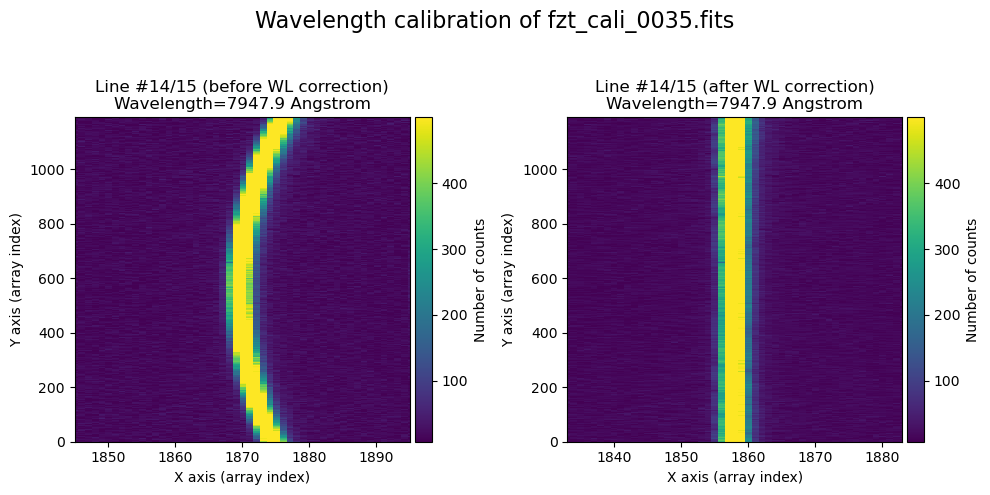

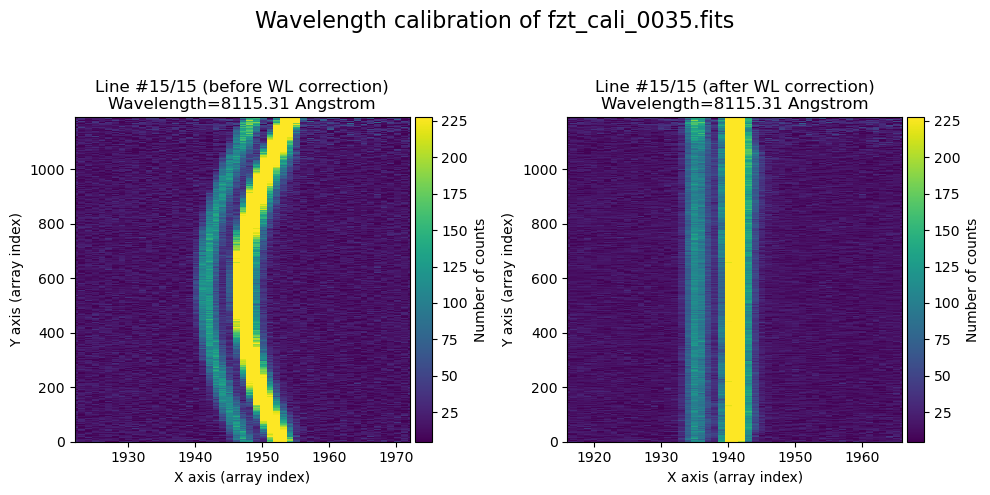

In [55]:
wavecalib.plot_data_comparison(data_before=data,
                               data_after=data_wavecalib,
                               crval1=crval1,
                               cdelt1=cdelt1,
                               title=f'Wavelength calibration of {input_filename}',
                               semi_window=25)

#### CCDData object (image, mask, uncertainty)

In a practical way we will want to apply the wavelength calibration, determined from an arc, on scientific images. And those scientific images (already corrected from BIAS and FLAT) will be stored in a FITS file. For this we will use the `apply_wavecal_ccdata()` function that performs this task on the corresponding FITS file, which will contain a primary HDU (the data array) and two extensions (`MASK` and `UNCERT`).

We illustrate this by running the function on the FITS file that stores the arc image itself.

In [56]:
tea.apply_wavecal_ccddata(infile=dir_calibration / input_filename,
                          wcalibfile=dir_calibration / f'wavecal_{input_filename}',
                          outfile=dir_calibration / f'w{input_filename}',
                          crval1=crval1,
                          cdelt1=cdelt1,
                          silent_mode=False)

>>> Reading file.........: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/wavecal_fzt_cali_0035.fits
>>> minimum CRVAL1 linear: 4213.051948228273 Angstrom
>>> maximum CRMAX1 linear: 8309.996925924657 Angstrom
>>> mean CDELT1..........: 2.010277221637087 Angstrom

>>> Reading file.........: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/fzt_cali_0035.fits

Applying calibration to primary HDU
>>> Using CDELT1: 1 pix
>>> Using CRVAL1: 4213.051948228273 Angstrom
>>> Using CDELT1: 2.010277221637087 Angstrom / pix


Applying wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]


Applying calibration to MASK extension
>>> Using CDELT1: 1 pix
>>> Using CRVAL1: 4213.051948228273 Angstrom
>>> Using CDELT1: 2.010277221637087 Angstrom / pix


Applying wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]


Applying calibration to UNCERT extension
>>> Using CDELT1: 1 pix
>>> Using CRVAL1: 4213.051948228273 Angstrom
>>> Using CDELT1: 2.010277221637087 Angstrom / pix


Applying wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]

--> Output FITS file.....: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/wfzt_cali_0035.fits


### Apply wavelength calibration to scientific images

In [57]:
ifc_science = ImageFileCollection(location=f'{dir_calibration}',
                                  filenames=list_science,
                                  keywords=selected_keywords)

summary_science = tea.ifc_statsummary(ifc_science, dir_calibration)
summary_science.show_in_notebook()

  0%|          | 0/4 [00:00<?, ?it/s]

DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

**Type here the scientific frame you want to correct**

In [61]:
## MODIFY THE FOLLOWING

filename_target = f'fzt_science_galaxy_3.fits'

tea.apply_wavecal_ccddata(infile=dir_calibration / filename_target,
                          wcalibfile=dir_calibration / f'wavecal_{input_filename}',
                          outfile=dir_calibration / f'w{filename_target}',
                          crval1=crval1,
                          cdelt1=cdelt1,
                          silent_mode=False)

>>> Reading file.........: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/wavecal_fzt_cali_0035.fits
>>> minimum CRVAL1 linear: 4213.051948228273 Angstrom
>>> maximum CRMAX1 linear: 8309.996925924657 Angstrom
>>> mean CDELT1..........: 2.010277221637087 Angstrom

>>> Reading file.........: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/fzt_science_galaxy_3.fits

Applying calibration to primary HDU
>>> Using CDELT1: 1 pix
>>> Using CRVAL1: 4213.051948228273 Angstrom
>>> Using CDELT1: 2.010277221637087 Angstrom / pix


Applying wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]


Applying calibration to MASK extension
>>> Using CDELT1: 1 pix
>>> Using CRVAL1: 4213.051948228273 Angstrom
>>> Using CDELT1: 2.010277221637087 Angstrom / pix


Applying wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]


Applying calibration to UNCERT extension
>>> Using CDELT1: 1 pix
>>> Using CRVAL1: 4213.051948228273 Angstrom
>>> Using CDELT1: 2.010277221637087 Angstrom / pix


Applying wavelength calibration:   0%|          | 0/1191 [00:00<?, ?it/s]

--> Output FITS file.....: /home/diegosuzaku/NGC2366Workshop/calibration/spectroscopy/wfzt_science_galaxy_3.fits
